# Capstone Project - The Battle of the Neighborhoods (Week 2)

## Applied Data Science Capstone by IBM/Coursera

###                          Alelign Faris

## Importing Libraries and associated packages to perform Data Visualisation and Exploratory Data Analysis

In [95]:
import matplotlib as mpl
import matplotlib.pyplot as plt
# Import Pandas and Numpy to provide DataFrame support
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import numpy as np

mpl.style.use('ggplot') # optional: for ggplot-like style

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

#Importing folium to visualise Maps and plot based on Lat and Lng
import folium

#Requests to request web pages by making get requests to FourSquare REST Client
import requests

#To normalise data returned by FourSquare API
from pandas.io.json import json_normalize

#Importing KMeans from SciKit library to Classify neighborhoods into clusters
from sklearn.cluster import KMeans

# Use Folium to display the Maps for Visualisation
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from folium import plugins

# Module to convert an address into latitude and longitude values
from geopy.geocoders import Nominatim

print('Libraries imported')

Libraries imported


## Loading the Seattle Crime csv data into Pandas DataFrame which is downloaded from Seattle Ploice department site

In [96]:
df = pd.read_csv('/Users/alelignfaris/Desktop/spd_report.csv', index_col= None)
df.columns = ['offence_type', 'offence_description', 'report_date', 'latitude', 'longitude']
# df.columns = ['offence_type', 'offence_description', 'report_date', 'latitude', 'longitude','year', 'month_name', 'day_name','hour']   
df = df[df['report_date'] >= '2008']

df.head()

,offence_type,offence_description,report_date,latitude,longitude
0,VEH-THEFT-AUTO,VEHICLE THEFT,2016-08-22T10:20:00,47.670891,-122.365631
1,THEFT-LICENSE PLATE,OTHER PROPERTY,2016-08-27T17:25:00,47.635548,-122.403702
2,ASSLT-AGG-GUN,ASSAULT,2016-08-28T01:25:00,47.602013,-122.332252
3,THEFT-LICENSE PLATE,OTHER PROPERTY,2016-08-28T10:24:00,47.608585,-122.288322
4,TRAFFIC,TRAFFIC,2016-08-28T02:14:00,47.617592,-122.318199


In [97]:
df['year'] = pd.DatetimeIndex(df['report_date']).year
df['month_name'] = pd.DatetimeIndex(df['report_date']).month_name()
df['day_name'] = pd.DatetimeIndex(df['report_date']).day_name()
df['hour'] = pd.DatetimeIndex(df['report_date']).hour
df = df[df['report_date'] >= '2008']
df.head()

,offence_type,offence_description,report_date,latitude,longitude,year,month_name,day_name,hour
0,VEH-THEFT-AUTO,VEHICLE THEFT,2016-08-22T10:20:00,47.670891,-122.365631,2016,August,Monday,10
1,THEFT-LICENSE PLATE,OTHER PROPERTY,2016-08-27T17:25:00,47.635548,-122.403702,2016,August,Saturday,17
2,ASSLT-AGG-GUN,ASSAULT,2016-08-28T01:25:00,47.602013,-122.332252,2016,August,Sunday,1
3,THEFT-LICENSE PLATE,OTHER PROPERTY,2016-08-28T10:24:00,47.608585,-122.288322,2016,August,Sunday,10
4,TRAFFIC,TRAFFIC,2016-08-28T02:14:00,47.617592,-122.318199,2016,August,Sunday,2


In [491]:
df.shape

(684283, 9)

In [98]:
df.offence_description.nunique()

57

## Displaying Crimes in Seattle WA from 2008 to 2016 Using Bar Graph in Each Year

Text(0.0, 1.0, 'Number of Crimes in Each Year from 2008 to 2016 in Seattle WA')

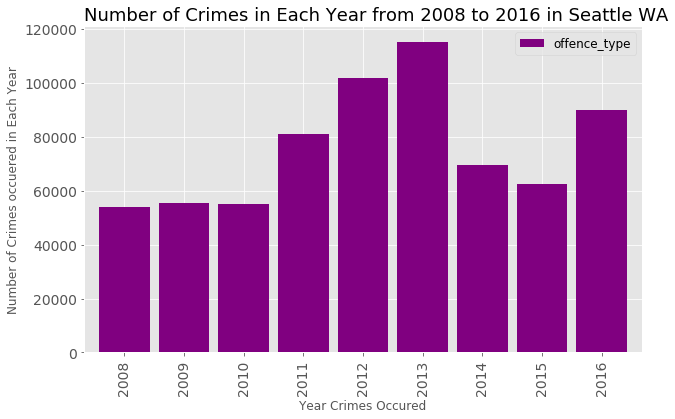

In [100]:


df.groupby('year').count().plot(y = 'offence_type', 
                                      kind='bar',
                                      color= 'purple',
                                      figsize=(10,6),
                                      width=0.85,
                                      fontsize=14,
#                                       df[0].set_color('r')
                                      colormap='tab20').legend(bbox_to_anchor=(1,1),
                                                               prop={'size': 12})

plt.xlabel('Year Crimes Occured')
plt.ylabel('Number of Crimes occuered in Each Year')
plt.title('Number of Crimes in Each Year from 2008 to 2016 in Seattle WA', loc='left', fontsize=18)        


## Displaying Crimes in Seattle WA from 2008 to 2016 Using Bar Graph in Each Month

Text(0.0, 1.0, 'Number of Crimes in Each Month from 2008 to 2016 in Seattle WA')

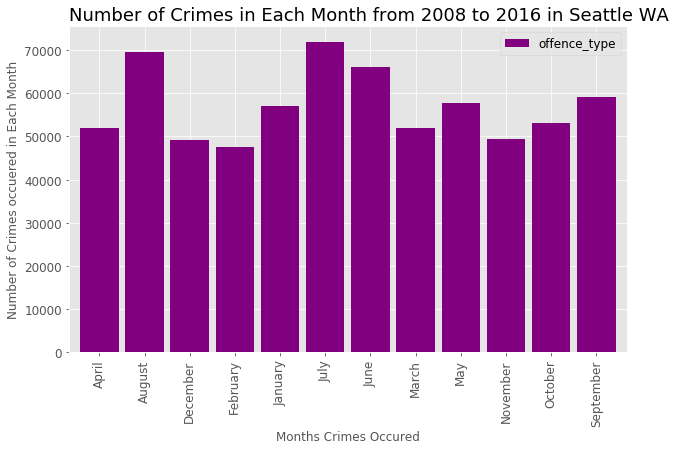

In [101]:
df.groupby('month_name').count().plot(y = 'offence_type', 
                                      kind='bar',
                                       color= 'purple',
                                      figsize=(10,6),
                                      width=0.85,
                                      fontsize=12,
                                      colormap='tab20').legend(bbox_to_anchor=(1,1),
                                                               prop={'size': 12})

plt.xlabel('Months Crimes Occured')
plt.ylabel('Number of Crimes occuered in Each Month')
plt.title('Number of Crimes in Each Month from 2008 to 2016 in Seattle WA', loc='left', fontsize=18)                                

## Displaying Crimes in Seattle WA from 2008 to 2016 Using Bar Graph in Each Day

## Displaying Crimes in Seattle WA from 2008 to 2016 Using Bar Graph in Each Hour 

Text(0.0, 1.0, 'Number of Crimes in Each Hours from 2008 to 2016 in Seattle WA')

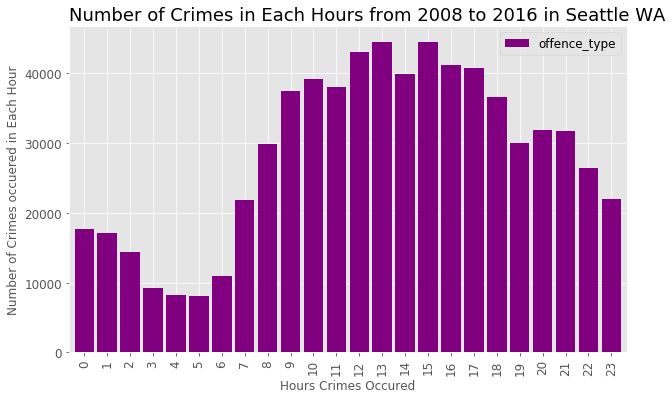

In [102]:
df.groupby('hour').count().plot(y = 'offence_type', 
                                      kind='bar',
                                    color= 'purple',
                                      figsize=(10,6),
                                      width=0.85,
                                      fontsize=12,
                                      colormap='tab20').legend(bbox_to_anchor=(1,1),
                                                               prop={'size': 12})

plt.xlabel('Hours Crimes Occured')
plt.ylabel('Number of Crimes occuered in Each Hour')
plt.title('Number of Crimes in Each Hours from 2008 to 2016 in Seattle WA', loc='left', fontsize=18)  

##  The ten most commonly occured Crimes in Seattle WA are:

In [103]:
# What Crimes are the 10 most commonly occuring ones 
df[['offence_description', 'offence_type']].groupby(
    ['offence_description'], as_index=False).count().sort_values(
    'offence_type', ascending=False).head(10)

,offence_description,offence_type
6,CAR PROWL,121108
34,OTHER PROPERTY,80860
4,BURGLARY,75257
37,PROPERTY DAMAGE,50845
52,VEHICLE THEFT,49009
1,ASSAULT,39031
19,FRAUD,36196
54,WARRANT ARREST,32498
47,STOLEN PROPERTY,23493
49,THREATS,23457


In [91]:
df.head()

,state,county,neighborhood,latitude,longitude
0,NY,Suffolk County,Holtsville,40.81,-73.04
1,NY,Suffolk County,Holtsville,40.81,-73.04
2,PR,Adjuntas Municipio,Adjuntas,18.16,-66.72
3,PR,Aguada Municipio,Aguada,18.38,-67.18
4,PR,Aguadilla Municipio,Aguadilla,18.43,-67.15


In [104]:
top_crimes = df[['offence_description', 'offence_type']].groupby(
    ['offence_description']).count().sort_values('offence_type', ascending=False)[:10].axes[0].tolist()

# Create a list of the 3 most commonly occuring crimes
top_three_crimes = df[['offence_description', 'offence_type']].groupby(
    ['offence_description']).count().sort_values('offence_type', ascending=False)[:3].axes[0].tolist()

# Create a list of the 2 most commonly occuring crimes
top_two_crimes = df[['offence_description', 'offence_type']].groupby(
    ['offence_description']).count().sort_values('offence_type', ascending=False)[:2].axes[0].tolist()

Text(0.5, 1.0, 'Number of Crimes Per Year]')

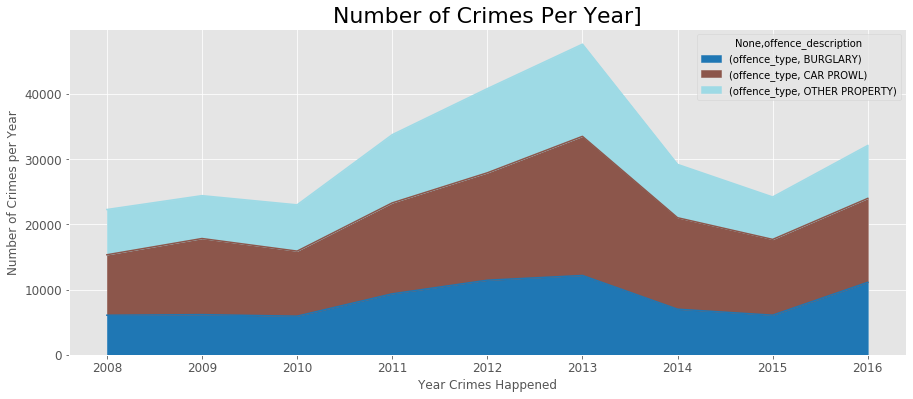

In [109]:
# Create a new data frame with just the top 10 crimes
df_top_crimes = df[df['offence_description'].isin(top_crimes)].copy()

# Create a new data frame with just the top 10 crimes
df_top3_crimes = df[df['offence_description'].isin(top_three_crimes)].copy()

df_top3_crimes[['offence_type', 'offence_description', 'year']].pivot_table(
    index='year', 
    columns='offence_description', 
    fill_value=0, 
    aggfunc='count').plot(kind='area',
                          stacked=True,
                          figsize=(15, 6),
                               fontsize=12,
                               colormap='tab20')
plt.xlabel('Year Crimes Happened')
plt.ylabel('Number of Crimes per Year')
plt.title('Number of Crimes Per Year]', loc='center', fontsize=22)

## An area graph which shows the five most common crimes in Seattle WA in each Year from 2008 to 2016

Text(0.5, 1.0, 'Number of Crimes Per Hour]')

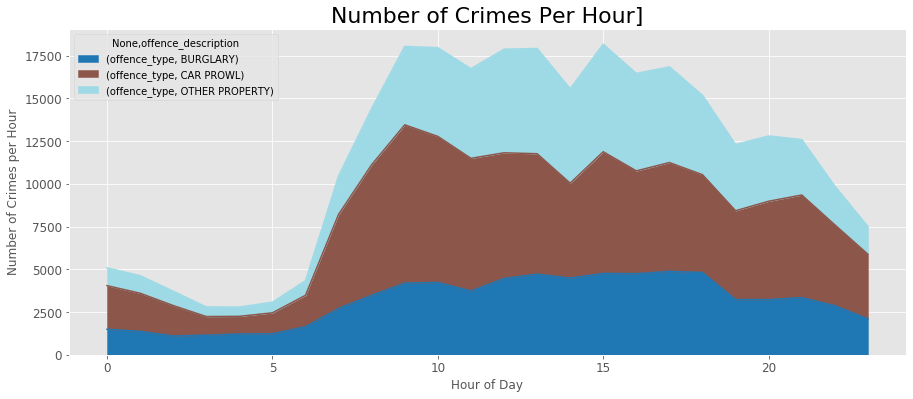

In [110]:
df_top3_crimes[['offence_type', 'offence_description', 'hour']].pivot_table(
    index='hour', 
    columns='offence_description', 
    fill_value=0, 
    aggfunc='count').plot(kind='area',
                          stacked=True,
                          figsize=(15, 6),
                               fontsize=12,
                               colormap='tab20')

plt.xlabel('Hour of Day')
plt.ylabel('Number of Crimes per Hour')
plt.title('Number of Crimes Per Hour]', loc='center', fontsize=22)

## An area graph which shows the five most common crimes in Seattle WA per Hour from 2008 to 2016

In [43]:
seattle_latitude = 47.608013
seattle_longitude = -122.335167

In [44]:
# create map and display it
seattle_map = folium.Map(location=[seattle_latitude, seattle_longitude], zoom_start=12)

# display the map of Seattle
seattle_map

In [517]:
df_top_crimes.dtypes

offence_type            object
offence_description     object
report_date             object
latitude               float64
longitude              float64
year                     int64
month_name              object
day_name                object
hour                     int64
dtype: object

In [526]:
limit = 100
df = df.iloc[0:limit, :]
df.head()

,offence_type,offence_description,report_date,latitude,longitude,year,month_name,day_name,hour
0,VEH-THEFT-AUTO,VEHICLE THEFT,2016-08-22T10:20:00,47.670891,-122.365631,2016,August,Monday,10
1,THEFT-LICENSE PLATE,OTHER PROPERTY,2016-08-27T17:25:00,47.635548,-122.403702,2016,August,Saturday,17
2,ASSLT-AGG-GUN,ASSAULT,2016-08-28T01:25:00,47.602013,-122.332252,2016,August,Sunday,1
3,THEFT-LICENSE PLATE,OTHER PROPERTY,2016-08-28T10:24:00,47.608585,-122.288322,2016,August,Sunday,10
4,TRAFFIC,TRAFFIC,2016-08-28T02:14:00,47.617592,-122.318199,2016,August,Sunday,2


In [527]:
df.shape

(100, 9)

# #Create a folium map with  different colour per crime
Colour each of the top 10 crimes with a different and plot on a Folium map

In [520]:
# Create a list of colours. 
# We have  list of the top 10 crimes from earlier
colors = [
    'red',
    'blue',
    'gray',
    'orange',
    'beige',
    'green',
    'purple',
    'cyan',
    'cadetblue',
    'black'
]

# Create a dictionary of colours to map to the crimes
dict_colours = dict(zip(top_crimes, colors))

# Add the colours colums to the df_top_crimes DataFrame
df_top_crimes['colour'] = df_top_crimes.offence_description.map(dict_colours)

#### The entire df_top_crimes DataFrame contains too many point to disply effeciently using Folium. To combat this we will just use the data from August 2018.

### I have commented this cell purposfully to reduce the volume data while I am uploading to gitHub

In [406]:

# # Define the world map centered around Seattle with a higher zoom level
# seattle_map = folium.Map(location=[seattle_latitude, seattle_longitude], zoom_start=11)

# # display Seattle map
# seattle_map

# # Instantiate a feature group for the incidents in the dataframe
# incidents = folium.map.FeatureGroup()

# # loop through the 100 crimes and add each to the incidents feature group
# for lat, lng, col in zip(df_top_crimes.latitude, 
#                          df_top_crimes.longitude, 
#                          df_top_crimes.colour):
#     incidents.add_child(
#         folium.features.CircleMarker(
#             [lat, lng],
#             radius=1, # define how big you want the circle markers to be
#             color=col,
#             fill=True,
#             fill_color=col,
#             fill_opacity=0.6
#         )
#     )

# # add incidents to map
# seattle_map.add_child(incidents)


You can also add some pop-up text that would get displayed when you hover over a marker. Let's make each marker display the category of the crime when hovered over.

In [430]:
mc = MarkerCluster()

# Define the world map centered around Seattle with a higher zoom level
seattle_cluster = folium.Map(location=[bellevue_latitude, bellevue_longitude], zoom_start=11)

# display world map
seattle_cluster

#creating a Marker for each point in df_sample. Each point will get a popup with their zip
for row in df_top_crimes_august.itertuples():
    mc.add_child(folium.Marker(
        location=[row.latitude,  row.longitude],
                 popup=row.offence_description))

seattle_cluster.add_child(mc)
seattle_cluster

When we zoom out all the way, all markers are grouped into one cluster, *the global cluster*, of 100 markers or crimes, which is the total number of crimes in our dataframe. Once you start zooming in, the *global cluster* will start breaking up into smaller clusters. Zooming in all the way will result in individual markers.

In [431]:
from folium import plugins
from folium.plugins import HeatMap

seattle_heatmap = folium.Map(location=[bellevue_latitude, bellevue_longitude], zoom_start=11) 

# List comprehension to make out list of lists
heat_data = [[row['latitude'], 
              row['longitude']] for index, row in df_top_crimes_august.iterrows()]

# Plot it on the map
HeatMap(heat_data,
        min_opacity=0.5,
        max_zoom=20, 
        max_val=1.0, 
        radius=20,
        blur=20,
        gradient=None,
        overlay=True).add_to(seattle_heatmap)

# Display the map
seattle_heatmap

### Loading the Seattle Traffic Collision csv data into Pandas DataFrame which is downloaded from SDT site

In [112]:
df = pd.read_csv('/Users/alelignfaris/Desktop/collisions.csv', index_col= None)   
df.head()

,COLLISIONTYPE,SEVERITYDESC,INCDATE,WEATHER,ROADCOND,latitude,longitude
0,Sideswipe,Property Damage Only Collision,2004/03/03 00:00:00+00,Overcast,Wet,47.715823,-122.317685
1,Parked Car,Property Damage Only Collision,2012/04/07 00:00:00+00,Clear,Dry,47.523310,-122.273540
2,Cycles,Injury Collision,2005/06/15 00:00:00+00,Clear,Dry,47.666267,-122.300605
3,Parked Car,Property Damage Only Collision,2013/03/27 00:00:00+00,Clear,Dry,47.612451,-122.326436
4,NaN,Unknown,2007/05/02 00:00:00+00,NaN,NaN,47.571514,-122.334437


In [113]:
df.shape

(219675, 7)

### Extracting the Year, Month, Month_name, and Day_ name data from the date date data column

In [114]:
df['year'] = pd.DatetimeIndex(df['INCDATE']).year
df['month'] = pd.DatetimeIndex(df['INCDATE']).month
df['month_name'] = pd.DatetimeIndex(df['INCDATE']).month_name()
df['day_name'] = pd.DatetimeIndex(df['INCDATE']).day_name()
df = df[df['INCDATE'] >= '2003']
df.head()

,COLLISIONTYPE,SEVERITYDESC,INCDATE,WEATHER,ROADCOND,latitude,longitude,year,month,month_name,day_name
0,Sideswipe,Property Damage Only Collision,2004/03/03 00:00:00+00,Overcast,Wet,47.715823,-122.317685,2004,3,March,Wednesday
1,Parked Car,Property Damage Only Collision,2012/04/07 00:00:00+00,Clear,Dry,47.523310,-122.273540,2012,4,April,Saturday
2,Cycles,Injury Collision,2005/06/15 00:00:00+00,Clear,Dry,47.666267,-122.300605,2005,6,June,Wednesday
3,Parked Car,Property Damage Only Collision,2013/03/27 00:00:00+00,Clear,Dry,47.612451,-122.326436,2013,3,March,Wednesday
4,NaN,Unknown,2007/05/02 00:00:00+00,NaN,NaN,47.571514,-122.334437,2007,5,May,Wednesday


## Displaying Collision type data of Seattle WA from 2003 to 2020 Using Bar Graph in Each Year

Text(0.0, 1.0, 'Number of collisions in Each Year from 2003 to 2020 In Seattle WA')

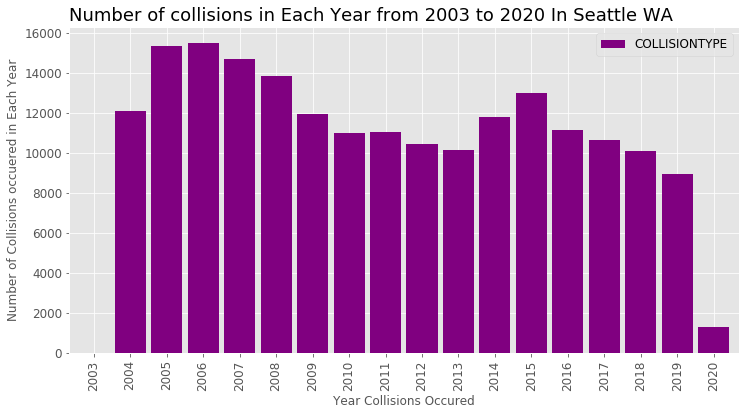

In [116]:
df.groupby('year').count().plot(y = 'COLLISIONTYPE', 
                                      kind='bar',
                                     color= 'purple',
                                      figsize=(12,6),
                                      width=0.85,
                                      fontsize=12,
                                      colormap='tab20').legend(bbox_to_anchor=(1,1),
                                                               prop={'size': 12})
plt.xlabel('Year Collisions Occured')
plt.ylabel('Number of Collisions occuered in Each Year')
plt.title('Number of collisions in Each Year from 2003 to 2020 In Seattle WA', loc='left', fontsize=18)                                

## Displaying Collision type data of Seattle WA from 2003 to 2020 Using Bar Graph in Each Month

Text(0.0, 1.0, 'Number of collisions in Each Month from 2003 to 2020 In Seattle WA')

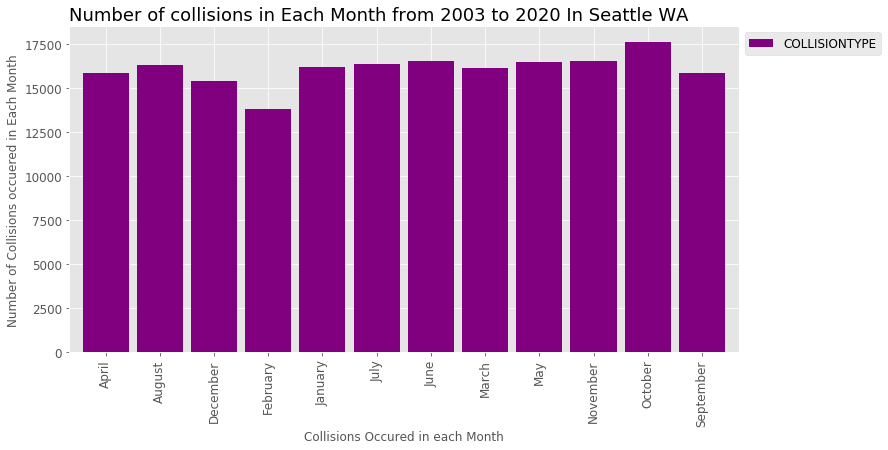

In [117]:
df.groupby('month_name').count().plot(y = 'COLLISIONTYPE', 
                                      kind='bar',
                                       color= 'purple',
                                      figsize=(12,6),
                                      width=0.85,
                                      fontsize=12,
                                      colormap='tab20').legend(bbox_to_anchor=(1,1),
                                                               prop={'size': 12})

plt.xlabel('Collisions Occured in each Month')
plt.ylabel('Number of Collisions occuered in Each Month')
plt.title('Number of collisions in Each Month from 2003 to 2020 In Seattle WA', loc='left', fontsize=18)  

## Displaying Collision type data of Seattle WA from 2003 to 2020 Using Bar Graph in Each Day

Text(0.0, 1.0, 'Number of Collisions in Each Day from 2003 to 2020 In Seattle WA')

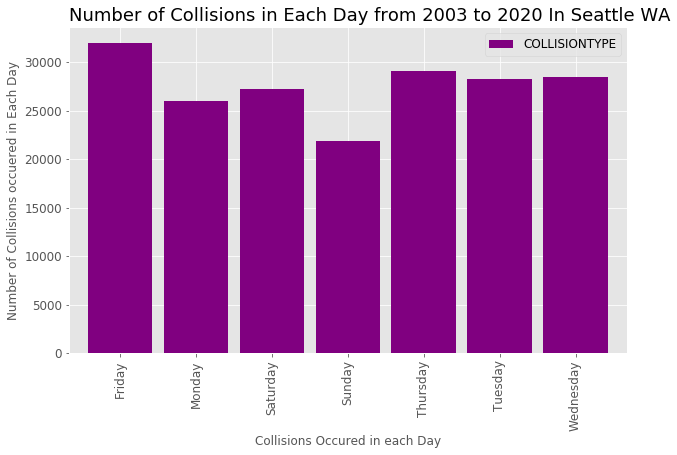

In [535]:
df.groupby('day_name').count().plot(y = 'COLLISIONTYPE', 
                                      kind='bar',
                                     color= 'purple',
                                      figsize=(10,6),
                                      width=0.85,
                                      fontsize=12,
                                      colormap='tab20').legend(bbox_to_anchor=(1,1),
                                                               prop={'size': 12})

plt.xlabel('Collisions Occured in each Day')
plt.ylabel('Number of Collisions occuered in Each Day')
plt.title('Number of Collisions in Each Day from 2003 to 2020 In Seattle WA', loc='left', fontsize=18)  

## Displaying Collision type data of Seattle WA from 2003 to 2020 Using Bar Graph By Severity group

Text(0.0, 1.0, 'Number of Severe Collisions occured from 2003 to 2020 In Seattle WA')

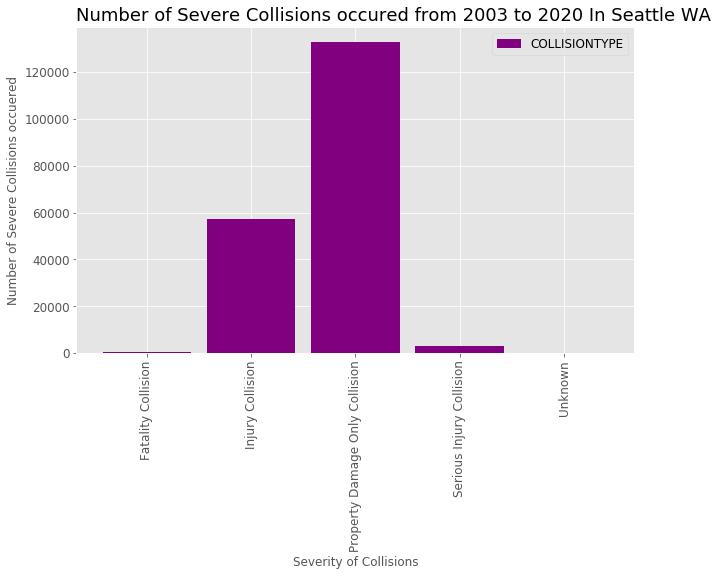

In [118]:
df.groupby('SEVERITYDESC').count().plot(y = 'COLLISIONTYPE', 
                                      kind='bar',
                                     color= 'purple',
                                      figsize=(10,6),
                                      width=0.85,
                                      fontsize=12,
                                      colormap='tab20').legend(bbox_to_anchor=(1,1),
                                                               prop={'size': 12})
plt.xlabel('Severity of Collisions')
plt.ylabel('Number of Severe Collisions occuered')
plt.title('Number of Severe Collisions occured from 2003 to 2020 In Seattle WA', loc='left', fontsize=18)    

## Displaying Collision  data of Seattle WA from 2003 to 2020 Using Bar Graph in different Weather

Text(0.0, 1.0, 'Number of collisions by different weather from 2003 to 2020 in Seattle WA')

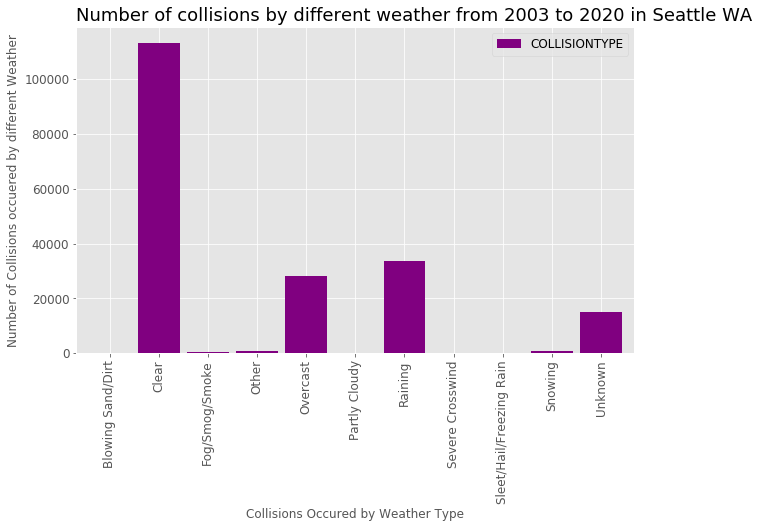

In [537]:
df.groupby('WEATHER').count().plot(y = 'COLLISIONTYPE', 
                                      kind='bar',
                                      color= 'purple',
                                      figsize=(10,6),
                                      width=0.85,
                                      fontsize=12,
                                      colormap='tab20').legend(bbox_to_anchor=(1,1),
                                                               prop={'size': 12})
plt.xlabel('Collisions Occured by Weather Type')
plt.ylabel('Number of Collisions occuered by different Weather')
plt.title('Number of collisions by different weather from 2003 to 2020 in Seattle WA', loc='left', fontsize=18) 

### Displaying Collision data of Seattle WA from 2003 to 2020 Using Bar Graph by Road Type

Text(0.0, 1.0, 'Number of collisions in different Road from 2003 to 2020 in Seattle WA')

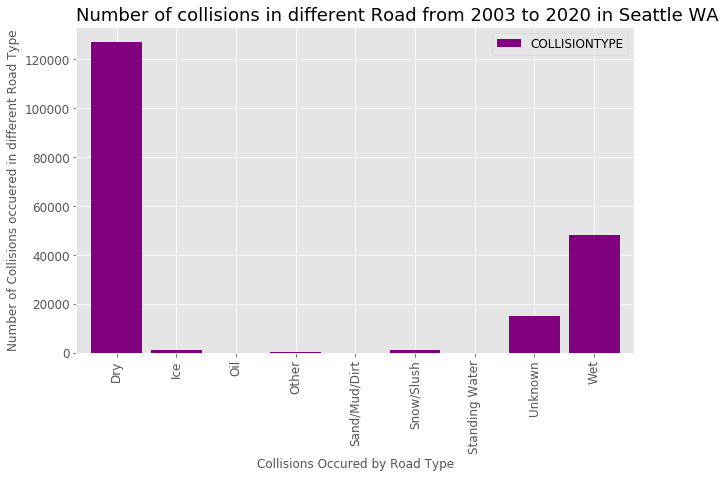

In [538]:
df.groupby('ROADCOND').count().plot(y = 'COLLISIONTYPE', 
                                    
                                      kind='bar',
                                      color= 'purple',
                                      figsize=(10,6),
                                      width=0.85,
                                      fontsize=12,
                                      colormap='tab20').legend(bbox_to_anchor=(1,1),
                                                               prop={'size': 12})
plt.xlabel('Collisions Occured by Road Type')
plt.ylabel('Number of Collisions occuered in different Road Type')
plt.title('Number of collisions in different Road from 2003 to 2020 in Seattle WA', loc='left', fontsize=18) 

### Explore and cluster the Counties and Neighborhoods in Seattle WA

In [2]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files


!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Libraries imported.


##  1. Download and Explore the Washington sate Counties and Neighborhoods  Dataset

### Loading the Washington sate Counties and Neighborhoods in to Pandas Data Frame for further analysis


#### I selected King County county  Only in order to limit the data size

In [3]:
df = pd.read_csv('/Users/alelignfaris/Desktop/zip_code_database.csv', index_col=None)
# Extarcting Washington state King County 
filt = (df['state']== 'WA')& (df['county']== 'King County')
dataFrame = df.loc[filt]
dataFrame.head()

,state,county,neighborhood,latitude,longitude
41625,WA,King County,Auburn,47.30,-122.26
41626,WA,King County,Auburn,47.31,-122.22
41627,WA,King County,Federal Way,47.30,-122.31
41628,WA,King County,Bellevue,47.61,-122.21
41629,WA,King County,Bellevue,47.62,-122.16


In [4]:
dataFrame.to_csv('/Users/alelignfaris/Desktop/zip_code_database3.csv')

In [5]:
seattle_data = pd.read_csv('/Users/alelignfaris/Desktop/zip_code_database3.csv', index_col='state')
seattle_data.head()

,Unnamed: 0,county,neighborhood,latitude,longitude
state,,,,,
WA,41625,King County,Auburn,47.30,-122.26
WA,41626,King County,Auburn,47.31,-122.22
WA,41627,King County,Federal Way,47.30,-122.31
WA,41628,King County,Bellevue,47.61,-122.21
WA,41629,King County,Bellevue,47.62,-122.16


In [6]:
print('The dataframe has {} counties and {} neighborhoods.'.format(
        len(seattle_data['county'].unique()),
       seattle_data.shape[0]
    )
)

The dataframe has 1 counties and 125 neighborhoods.


In [7]:
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

### The geograpical coordinate of  Seatte City is:

In [46]:
address = 'Seattle, WA'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
seattle_latitude = location.latitude
seattle_longitude = location.longitude
print('The geograpical coordinate of Manhattan are {}, {}.'.format(seattle_latitude, seattle_longitude))

The geograpical coordinate of Manhattan are 47.6038321, -122.3300624.


In [47]:
seattle_latitude = 47.603832
seattle_longitude = -122.3300624

### Create the map of Seattle  with King Couty Neighborhoods superimposed on top it.

In [48]:
# create map of Seattle using latitude and longitude values
seattle_map = folium.Map(location=[seattle_latitude, seattle_longitude], zoom_start=10)

# add markers to map
for lat, lng, county, neighborhood in zip(seattle_data ['latitude'], seattle_data ['longitude'], seattle_data ['county'], seattle_data ['neighborhood']):
    label = '{}, {}'.format(neighborhood, county)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=7,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(seattle_map)  
    
seattle_map

### Here,  we are going to start utilizing the Foursquare API to explore the neighborhoods and segment them.

#### Define Foursquare Credentials and Version

In [49]:
CLIENT_ID = '     LZEKP0PHNLGZYF135BD02KYPFV01P1FGIU4PGA3GWOG1BLDP'     # your Foursquare ID
CLIENT_SECRET = ' R0NKLYHVTKQNNONZHJASACDSSX10SZR4KO5XIFU2YZY0CG2E'     # your Foursquare Secret

VERSION = '20200621' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID:      LZEKP0PHNLGZYF135BD02KYPFV01P1FGIU4PGA3GWOG1BLDP
CLIENT_SECRET: R0NKLYHVTKQNNONZHJASACDSSX10SZR4KO5XIFU2YZY0CG2E


In [50]:
# Latitude and longitude values of Seattle WA
seattle_latitude = 47.603832
seattle_longitude = -122.3300624

LIMIT = 100 # limit of number of venues returned by Foursquare API



radius = 500 # define radius


 # create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    seattle_latitude, 
   seattle_longitude, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=     LZEKP0PHNLGZYF135BD02KYPFV01P1FGIU4PGA3GWOG1BLDP&client_secret= R0NKLYHVTKQNNONZHJASACDSSX10SZR4KO5XIFU2YZY0CG2E&v=20200621&ll=47.603832,-122.3300624&radius=500&limit=100'

In [51]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5ef0523c29ce6a001bcf8950'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'},
    {'name': '$-$$$$', 'key': 'price'}]},
  'headerLocation': 'Pioneer Square',
  'headerFullLocation': 'Pioneer Square, Seattle',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 98,
  'suggestedBounds': {'ne': {'lat': 47.6083320045, 'lng': -122.32340080191472},
   'sw': {'lat': 47.599331995499995, 'lng': -122.33672399808529}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '5762cc9ccd1085a720b1433e',
       'name': 'Biscuit B*tch',
       'location': {'address': '621 3rd Ave',
        'crossStreet': 'James St & Cherry St',
        'lat': 47.603237,
        'lng': -122.33201,


In [52]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

### Clean up the json data and structure it into a *pandas* dataframe.

In [55]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head(10)

/Users/alelignfaris/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  This is separate from the ipykernel package so we can avoid doing imports until


,name,categories,lat,lng
0,Biscuit B*tch,Breakfast Spot,47.603237,-122.332010
1,Columbia Tower Club,Social Club,47.604507,-122.330484
2,Juicy Cafe,Café,47.604329,-122.330958
3,Smith Tower Observation Bar,Cocktail Bar,47.602012,-122.331793
4,Tat's Delicatessen,Sandwich Place,47.601901,-122.332423
5,Hole in the Wall Barbecue,BBQ Joint,47.602525,-122.332009
6,Smith Tower,Building,47.601914,-122.331831
7,Top Pot Doughnuts,Donut Shop,47.604023,-122.332499
8,Manu's Bodega,Caribbean Restaurant,47.601625,-122.329653
9,Red Bowls,Noodle House,47.604654,-122.333211


In [56]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

98 venues were returned by Foursquare.


### 2. Explore Neighborhoods in King County WA

In [57]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [58]:
# type your answer here

seattle_venues = getNearbyVenues(names= seattle_data['neighborhood'],
                                   latitudes= seattle_data['latitude'],
                                   longitudes=seattle_data['longitude']
                                  )



Auburn
Auburn
Federal Way
Bellevue
Bellevue
Bellevue
Bellevue
Bellevue
Bellevue
Black Diamond
Bothell
Burton
Carnation
Bellevue
Duvall
Enumclaw
Federal Way
Fall City
Hobart
Issaquah
Kenmore
Issaquah
Kent
Kent
Kent
Kirkland
Kirkland
Kent
Maple Valley
Medina
Mercer Island
Bothell
Kent
North Bend
Pacific
Preston
Ravensdale
Redmond
Redmond
Redondo
Renton
Renton
Renton
Renton
Renton
Seahurst
Federal Way
Kent
Snoqualmie
Vashon
Auburn
Woodinville
Redmond
Sammamish
Sammamish
Woodinville
Kirkland
Kent
Auburn
Federal Way
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Seattle
Sea

#### The size of the resulting dataframe for tne nevues around Seattle neighborhoods are

In [59]:
print(seattle_venues.shape)
seattle_venues.head(10)

(2270, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Auburn,47.30,-122.26,Blue Heron Marsh,47.301337,-122.258242,Nature Preserve
1,Auburn,47.30,-122.26,Giving Tree (Near Customer Service - Train Court),47.300880,-122.254059,Toy / Game Store
2,Auburn,47.31,-122.22,Geaux Brewing,47.308101,-122.223383,Brewery
3,Auburn,47.31,-122.22,Zola's Coffee,47.307509,-122.223950,Coffee Shop
4,Auburn,47.31,-122.22,Athens Pizza and Pasta,47.308102,-122.216465,Italian Restaurant
5,Auburn,47.31,-122.22,Gor Gai Thai Street Food,47.307566,-122.221393,Thai Restaurant
6,Auburn,47.31,-122.22,Little Caesars Pizza,47.311172,-122.226347,Pizza Place
7,Auburn,47.31,-122.22,Auburn Performing Arts Center,47.309572,-122.219992,Performing Arts Venue
8,Auburn,47.31,-122.22,Starting Gate Restaurant,47.311904,-122.225624,American Restaurant
9,Auburn,47.31,-122.22,Wells Fargo Bank,47.308549,-122.226232,Bank


#### To check how many venues were returned for each neighborhood

In [60]:
seattle_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Auburn,23,23,23,23,23,23
Bellevue,194,194,194,194,194,194
Bothell,9,9,9,9,9,9
Carnation,2,2,2,2,2,2
Enumclaw,1,1,1,1,1,1
Federal Way,42,42,42,42,42,42
Issaquah,11,11,11,11,11,11
Kenmore,1,1,1,1,1,1
Kent,56,56,56,56,56,56


### checkout  how many unique categories can be returned from all the returned venues

In [61]:
print('There are {} uniques categories.'.format(len(seattle_venues['Venue Category'].unique())))

There are 251 uniques categories.


## 3. Analyze Each Neighborhood in King County WA

In [63]:
# one hot encoding
seattle_onehot = pd.get_dummies(seattle_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
seattle_onehot['neighborhood'] = seattle_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [seattle_onehot.columns[-1]] + list(seattle_onehot.columns[:-1])
seattle_onehot = seattle_onehot[fixed_columns]

seattle_onehot.head(10)

,neighborhood,ATM,Accessories Store,Airport,Airport Terminal,American Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Automotive Shop,BBQ Joint,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Bus Line,Bus Station,Bus Stop,Business Service,Café,Campground,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Science Building,Comedy Club,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Creperie,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dumpling Restaurant,Electronics Store,Emergency Room,Empanada Restaurant,Ethiopian Restaurant,Event Service,Exhibit,Eye Doctor,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,General Travel,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Inn,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Korean Restaurant,Lake,Latin American Restaurant,Lawyer,Light Rail Station,Lingerie Store,Locksmith,Lounge,Marijuana Dispensary,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Mexican Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Motel,Movie Theater,Moving Target,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Organic Grocery,Other Repair Shop,Outdoor Sculpture,Park,Performing Arts Venue,Pet Store,Pharmacy,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Police Station,Pool,Pool Hall,Post Office,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Rental Service,Rest Area,Restaurant,Rock Club,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Ski Area,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Storage Facility,Supermarket,Supplement Shop,Sushi Restaurant,Taco Place,Tanning Salon,Tapas Restaurant,Tattoo Parlor,Tea Room,Tennis Court,Thai Restaurant,Theater,Thrift / Vintage Store,Tour Provider,Toy / Game Store,Track,Trail,Train Station,Tree,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Wine Bar,Wine Shop,Winery,Yoga Studio
0,Auburn,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Auburn,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [64]:
seattle_onehot.shape

(2270, 252)

#### Here we can  group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [67]:
seattle_grouped = seattle_onehot.groupby('neighborhood').mean().reset_index()
seattle_grouped

,neighborhood,ATM,Accessories Store,Airport,Airport Terminal,American Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Automotive Shop,BBQ Joint,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Bus Line,Bus Station,Bus Stop,Business Service,Café,Campground,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Science Building,Comedy Club,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Creperie,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dumpling Restaurant,Electronics Store,Emergency Room,Empanada Restaurant,Ethiopian Restaurant,Event Service,Exhibit,Eye Doctor,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,General Travel,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Inn,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Korean Restaurant,Lake,Latin American Restaurant,Lawyer,Light Rail Station,Lingerie Store,Locksmith,Lounge,Marijuana Dispensary,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Mexican Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Motel,Movie Theater,Moving Target,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Organic Grocery,Other Repair Shop,Outdoor Sculpture,Park,Performing Arts Venue,Pet Store,Pharmacy,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Police Station,Pool,Pool Hall,Post Office,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Rental Service,Rest Area,Restaurant,Rock Club,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Ski Area,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Storage Facility,Supermarket,Supplement Shop,Sushi Restaurant,Taco Place,Tanning Salon,Tapas Restaurant,Tattoo Parlor,Tea Room,Tennis Court,Thai Restaurant,Theater,Thrift / Vintage Store,Tour Provider,Toy / Game Store,Track,Trail,Train Station,Tree,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Wine Bar,Wine Shop,Winery,Yoga Studio
0,Auburn,0.000000,0.000000,0.000000,0.000000,0.043478,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.043478,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.043478,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.043478,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,

### Now it time to print each neighborhood along with the top 10 most common venues

In [70]:
num_top_venues = 10

for hood in seattle_grouped['neighborhood']:
    print("----"+hood+"----")
    temp = seattle_grouped[seattle_grouped['neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Auburn----
                 venue  freq
0          Pizza Place  0.04
1     Toy / Game Store  0.04
2     Football Stadium  0.04
3  Sporting Goods Shop  0.04
4          Coffee Shop  0.04
5              Brewery  0.04
6      Nature Preserve  0.04
7          Flower Shop  0.04
8        Grocery Store  0.04
9                  Gym  0.04


----Bellevue----
                venue  freq
0         Coffee Shop  0.06
1         Pizza Place  0.05
2  Italian Restaurant  0.04
3    Asian Restaurant  0.03
4          Restaurant  0.03
5      Sandwich Place  0.03
6                Park  0.03
7  Chinese Restaurant  0.02
8      Chocolate Shop  0.02
9      Clothing Store  0.02


----Bothell----
                 venue  freq
0                 Park  0.22
1          Golf Course  0.11
2                Trail  0.11
3       Farmers Market  0.11
4     Business Service  0.11
5  American Restaurant  0.11
6           Sports Bar  0.11
7            Gastropub  0.11
8         Neighborhood  0.00
9      Nature Preserve  0.00




### Now its time to put that into a pandas dataframe in descending order.

In [74]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

### This dataframe displays the top 10 venues for each neighborhood.

In [73]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = seattle_grouped['Neighborhood']

for ind in np.arange(seattle_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(seattle_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head(10)

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,0.0,Pizza Place,Thai Restaurant,Performing Arts Venue,Pharmacy,Deli / Bodega,Pilates Studio,Nature Preserve,Coffee Shop,Flower Shop,Shop & Service
1,0.0,Coffee Shop,Pizza Place,Italian Restaurant,Park,Sandwich Place,Asian Restaurant,Restaurant,Chinese Restaurant,Poke Place,Pharmacy
2,0.0,Park,Sports Bar,Farmers Market,Golf Course,American Restaurant,Gastropub,Trail,Business Service,Exhibit,Eye Doctor
3,0.0,Campground,Scenic Lookout,Yoga Studio,Dance Studio,Food,Fondue Restaurant,Flower Shop,Fish Market,Filipino Restaurant,Fast Food Restaurant
4,0.0,Lake,Yoga Studio,Food Service,Food & Drink Shop,Food,Fondue Restaurant,Flower Shop,Fish Market,Filipino Restaurant,Fast Food Restaurant
5,0.0,Korean Restaurant,Chinese Restaurant,Japanese Curry Restaurant,Coffee Shop,Mexican Restaurant,Comic Shop,Rental Car Location,BBQ Joint,Asian Restaurant,Clothing Store
6,0.0,Park,Yoga Studio,Pizza Place,Spa,Pet Store,Frozen Yogurt Shop,Dog Run,Farm,Exhibit,Eye Doctor
7,0.0,Art Gallery,Yoga Studio,Ethiopian Restaurant,Food & Drink Shop,Food,Fondue Restaurant,Flower Shop,Fish Market,Filipino Restaurant,Fast Food Restaurant
8,0.0,Coffee Shop,Mexican Restaurant,Pub,Park,Fast Food Restaurant,Chinese Restaurant,Greek Restaurant,Cosmetics Shop,Convenience Store,Breakfast Spot
9,0.0,Gym,Coffee Shop,Basketball Stadium,Park,Outdoor Sculpture,Sandwich Place,Pool,Soccer Field,Trail,Moving Target


### 4. Clustering The  Neighborhoods in Seattle WA

### I use k-means to cluster the neighborhood into 5 clusters.

In [82]:
# set number of clusters
kclusters = 5

seattle_grouped_clustering = seattle_grouped.drop('neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(seattle_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 0, 0, 1, 0, 0, 2, 0, 0], dtype=int32)

In [120]:
# # add clustering labels
# # neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

# seattle_merged = seattle_data

# # merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
# seattle_merged = seattle_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='neighborhood')

# seattle_merged.head() # check the last columns!

## Visualizing  the resulting clusters of the k_means clustering on the map

In [478]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
# rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(seattle_merged['latitude'], seattle_merged['longitude'], seattle_merged['neighborhood'], seattle_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
#         color=rainbow[cluster-1],
        fill=True,
#         fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

### 5. Examine Clusters

Now, you can examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, you can then assign a name to each cluster. I will leave this exercise to you.

## Cluster 1

In [479]:
seattle_merged.loc[seattle_merged['Cluster Labels'] == 0, seattle_merged.columns[[1] + list(range(5, seattle_merged.shape[1]))]]

,county,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
state,,,,,,,,,,,,
WA,King County,0.0,Pharmacy,Football Stadium,Coffee Shop,Italian Restaurant,Bank,Insurance Office,Flower Shop,Thai Restaurant,Thrift / Vintage Store,Toy / Game Store
WA,King County,0.0,Pharmacy,Football Stadium,Coffee Shop,Italian Restaurant,Bank,Insurance Office,Flower Shop,Thai Restaurant,Thrift / Vintage Store,Toy / Game Store
WA,King County,0.0,Korean Restaurant,Chinese Restaurant,Empanada Restaurant,Clothing Store,Japanese Curry Restaurant,Comic Shop,Rental Car Location,Construction & Landscaping,BBQ Joint,Coffee Shop
WA,King County,0.0,Coffee Shop,Pizza Place,Italian Restaurant,Park,Sandwich Place,Asian Restaurant,Restaurant,Chinese Restaurant,Poke Place,Pharmacy
WA,King County,0.0,Coffee Shop,Pizza Place,Italian Restaurant,Park,Sandwich Place,Asian Restaurant,Restaurant,Chinese Restaurant,Poke Place,Pharmacy
WA,King County,0.0,Coffee Shop,Pizza Place,Italian Restaurant,Park,Sandwich Place,Asian Restaurant,Restaurant,Chinese Restaurant,Poke Place,Pharmacy
WA,King County,0.0,Coffee Shop,Pizza Place,Italian Restaurant,Park,Sandwich Place,Asian Restaurant,Restaurant,Chinese Restaurant,Poke Place,Pharmacy
WA,King County,0.0,Coffee Shop,Pizza Place,Italian Restaurant,Park,Sandwich Place,Asian Restaurant,Restaurant,Chinese Restaurant,Poke Place,Pharmacy
WA,King County,0.0,Coffee Shop,Pizza Place,Italian Restaurant,Park,Sandwich Place,Asian Restaurant,Restaurant,Chinese Restaurant,Poke Place,Pharmacy


### Cluster 2

In [480]:
seattle_merged.loc[seattle_merged['Cluster Labels'] == 1, seattle_merged.columns[[1] + list(range(5, seattle_merged.shape[1]))]]

,county,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
state,,,,,,,,,,,,
WA,King County,1.0,Lake,Women's Store,Food Truck,Food Court,Food & Drink Shop,Food,Fondue Restaurant,Flower Shop,Fish Market,Filipino Restaurant


### Cluster 3

In [484]:
seattle_merged.loc[seattle_merged['Cluster Labels'] == 2, seattle_merged.columns[[1] + list(range(5, seattle_merged.shape[1]))]]

,county,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
state,,,,,,,,,,,,
WA,King County,2.0,Art Gallery,Women's Store,Empanada Restaurant,Food Court,Food & Drink Shop,Food,Fondue Restaurant,Flower Shop,Fish Market,Filipino Restaurant


### Cluster 4

In [485]:
seattle_merged.loc[seattle_merged['Cluster Labels'] == 3, seattle_merged.columns[[1] + list(range(5, seattle_merged.shape[1]))]]

,county,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
state,,,,,,,,,,,,
WA,King County,3.0,Campground,Scenic Lookout,Women's Store,Cycle Studio,Food & Drink Shop,Food,Fondue Restaurant,Flower Shop,Fish Market,Filipino Restaurant


### Cluster 5

In [486]:
seattle_merged.loc[seattle_merged['Cluster Labels'] == 4, seattle_merged.columns[[1] + list(range(5, seattle_merged.shape[1]))]]

,county,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
state,,,,,,,,,,,,
WA,King County,4.0,Gym,Construction & Landscaping,Filipino Restaurant,Ethiopian Restaurant,Exhibit,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Women's Store
WA,King County,4.0,Construction & Landscaping,Women's Store,Emergency Room,Food & Drink Shop,Food,Fondue Restaurant,Flower Shop,Fish Market,Filipino Restaurant,Fast Food Restaurant
